In [1]:
# this will help test changes to the source code dynamically
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
sys.path.append('../')

In [3]:
from src.load_data import load_data

## Loading to a dataframe

In [6]:
df = load_data()
df.shape

(271680, 8)

In [5]:
df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Name'], dtype='object')

In [6]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Name
0,2010-01-04,7.622500,7.660714,7.585000,7.643214,6.562591,493729600,AAPL
1,2010-01-05,7.664286,7.699643,7.616071,7.656429,6.573935,601904800,AAPL
2,2010-01-06,7.656429,7.686786,7.526786,7.534643,6.469369,552160000,AAPL
3,2010-01-07,7.562500,7.571429,7.466071,7.520714,6.457407,477131200,AAPL
4,2010-01-08,7.510714,7.571429,7.466429,7.570714,6.500339,447610800,AAPL


In [7]:
df.groupby('Name').size()

Name
AAPL    2943
ADBE    2943
ADI     2943
ADP     2943
ADSK    2943
        ... 
WBA     2943
WDAY    2242
XEL     2943
XLNX    2943
ZM       605
Length: 102, dtype: int64

In [9]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import matplotlib.cbook as cbook
from matplotlib.axis import Axis
def vol_traded(name):
    df_data = df.loc[df['Name'] == name]
    fig, ax = plt.subplots(figsize = (10,10))
    ax.plot('Date','Volume',data = df_data)
    ax.set(xlabel = "Date",ylabel = "Volume Traded",title = "Volume traded for {}\n2010-2021".format(name)) 
    Axis.set_major_locator(ax.xaxis,mdates.YearLocator())
    ax.format_xdata = mdates.DateFormatter('%Y')
    plt.show()

## Below graphs show us the volume of each companies stocks traded 

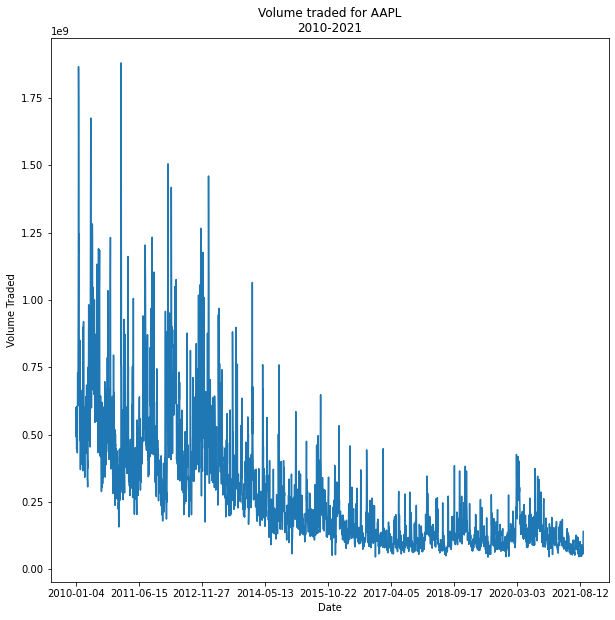

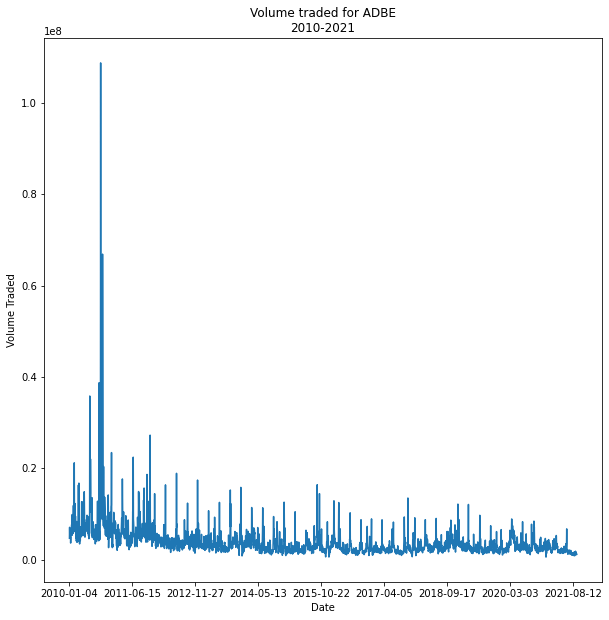

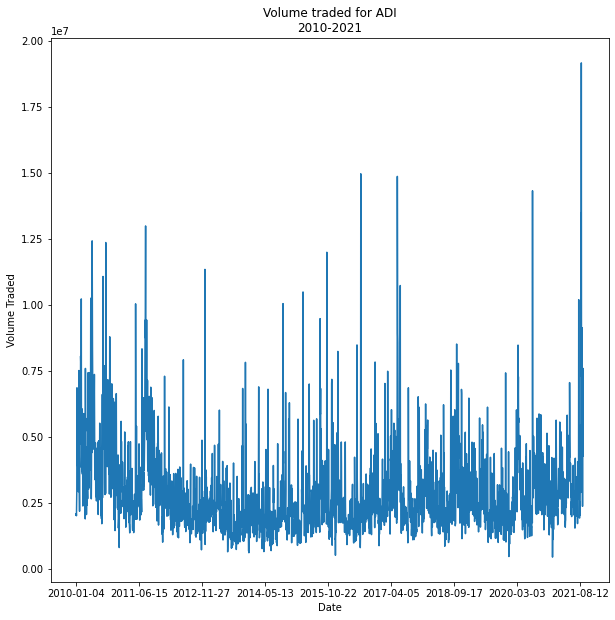

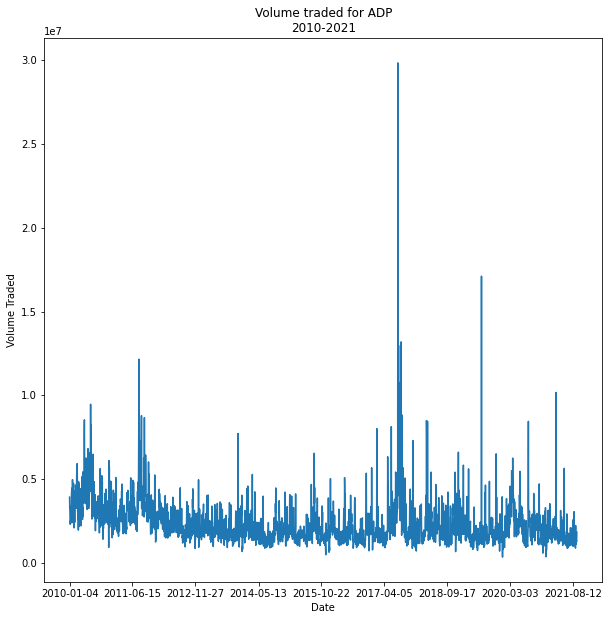

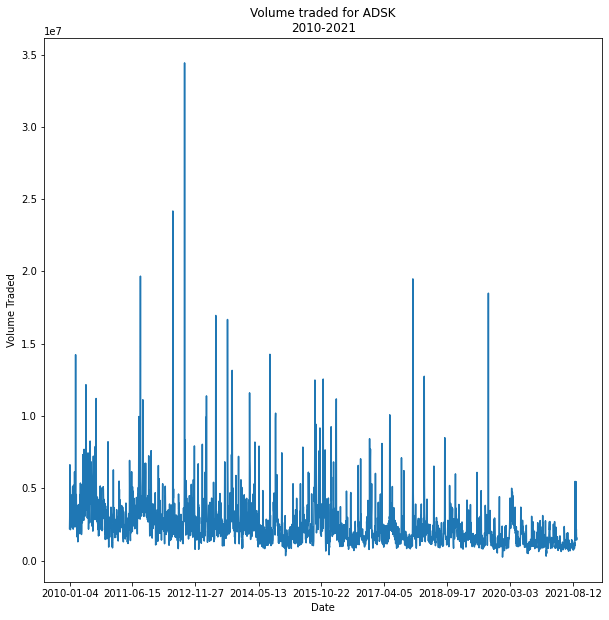

...

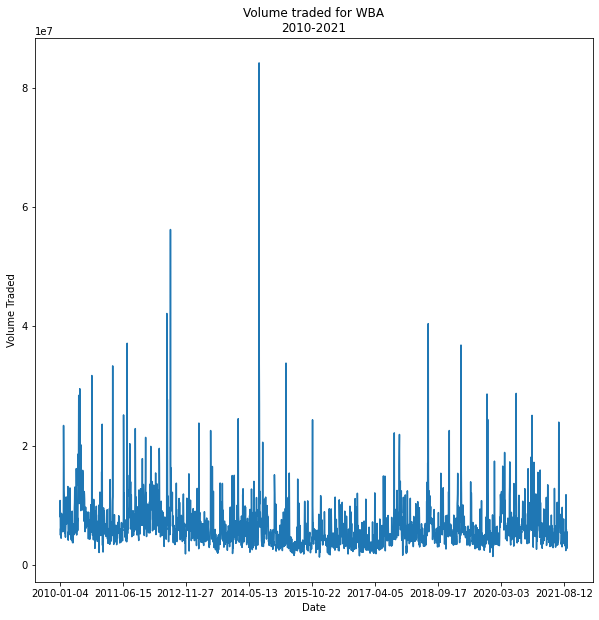

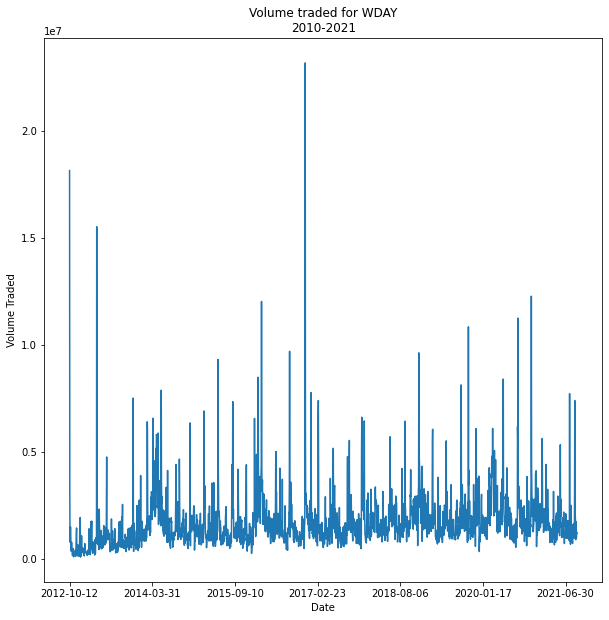

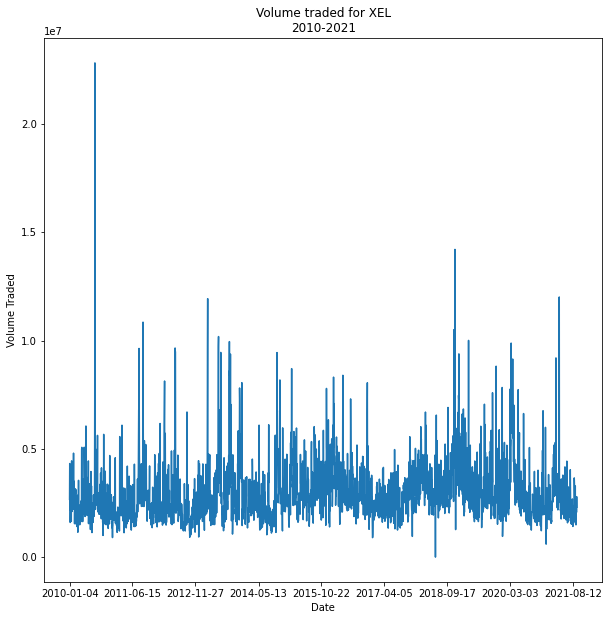

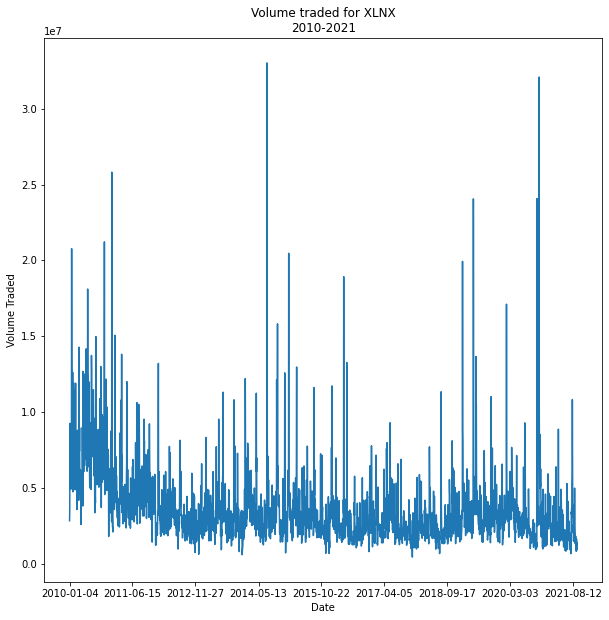

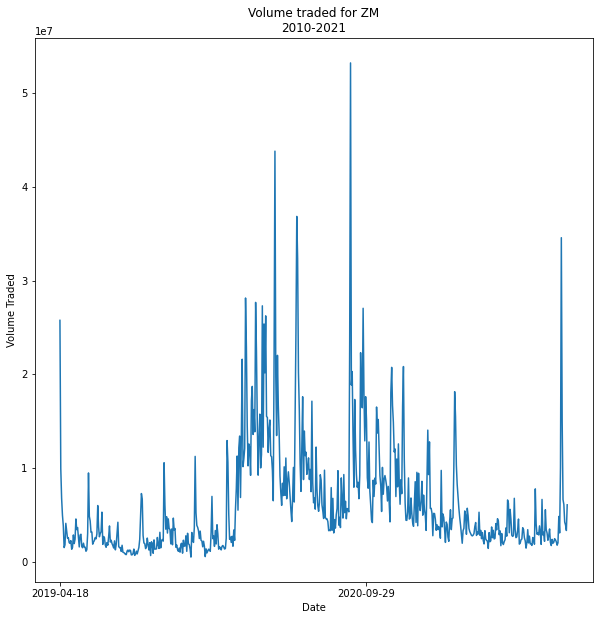

In [9]:
for name in df['Name'].unique():
    vol_traded(name)

Increasing volumes of stocks traded is expected since 2010 as many companies would have experienced growth. A better performance indicator would be to look at the price of each stock and how it has fluctuated over the years.

In [10]:
def closing_price(name):
    df_data = df.loc[df['Name'] == name]
    fig, ax = plt.subplots(figsize = (10,10))
    ax.plot('Date','Close',data = df_data)
    ax.set(xlabel = "Date",ylabel = "Closing Price",title = "Closing Price for {}\n2010-2021".format(name)) 
    Axis.set_major_locator(ax.xaxis,mdates.YearLocator())
    ax.format_xdata = mdates.DateFormatter('%Y')
    plt.show()

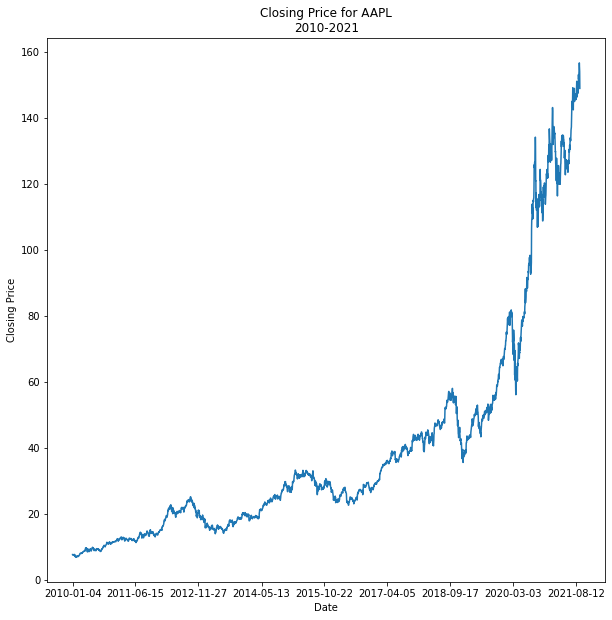

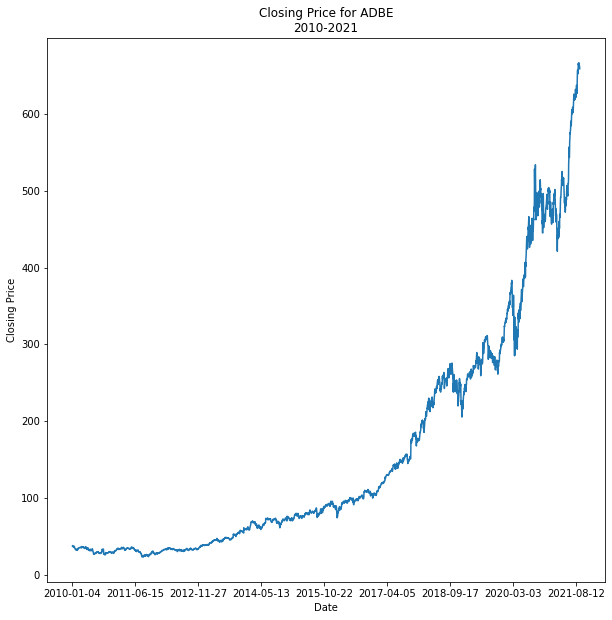

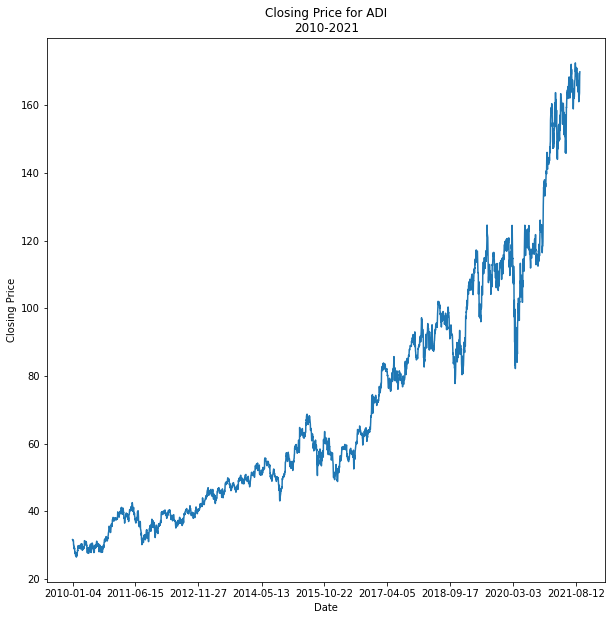

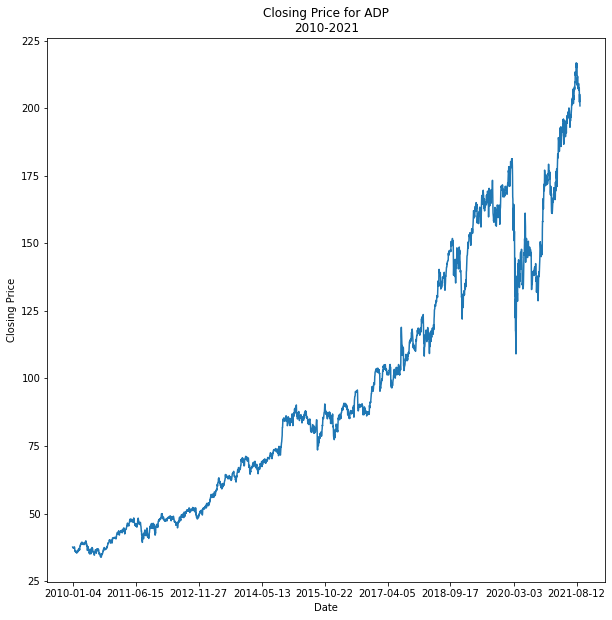

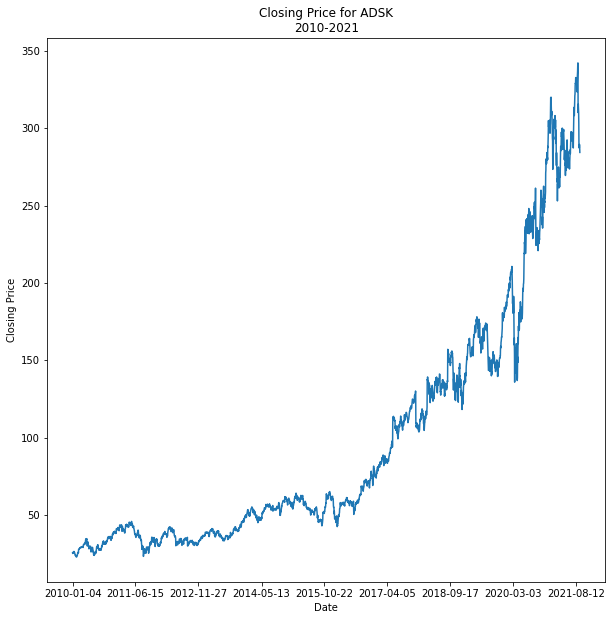

...

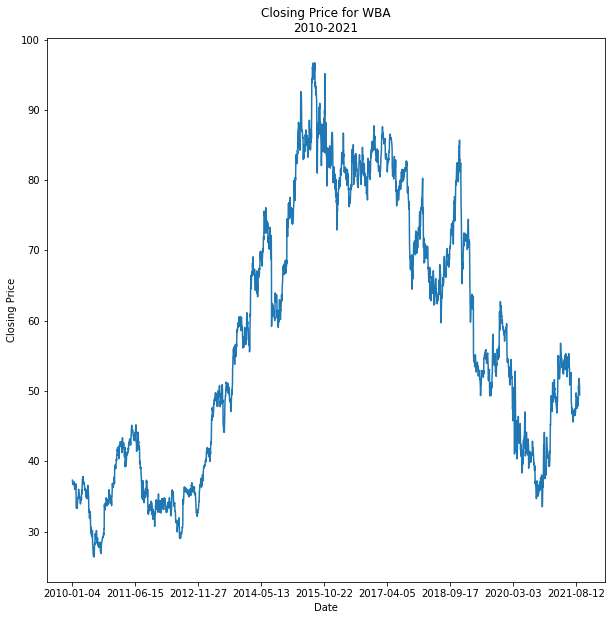

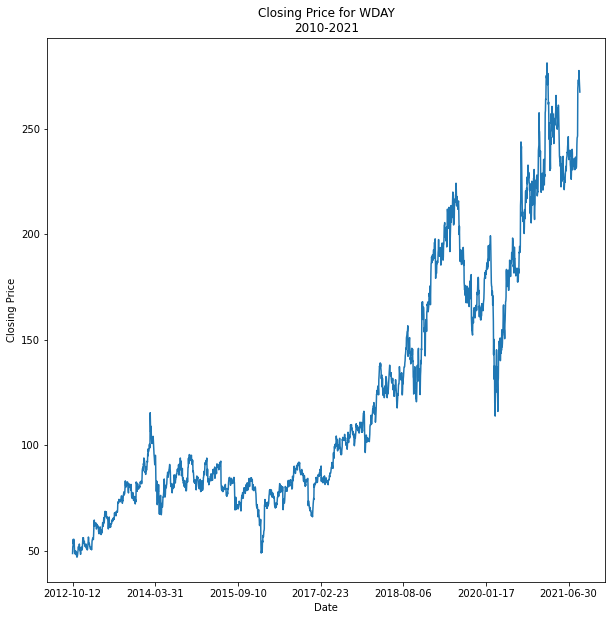

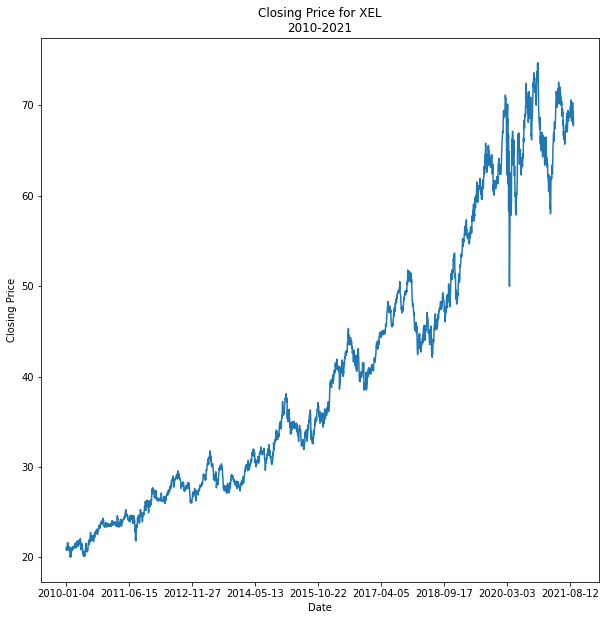

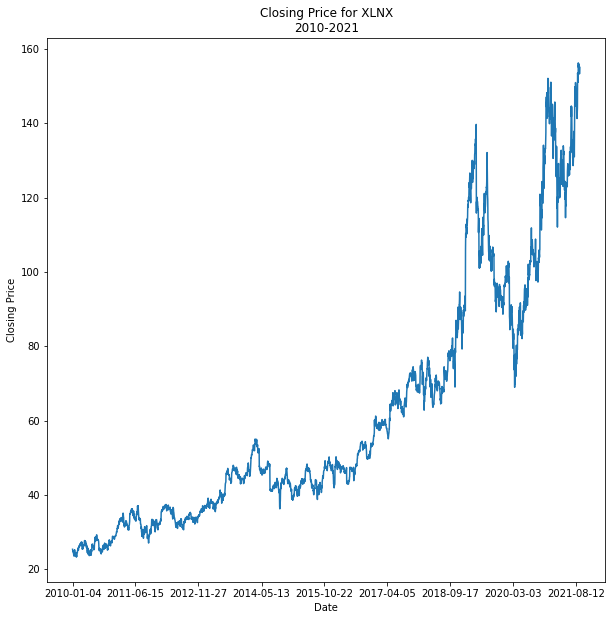

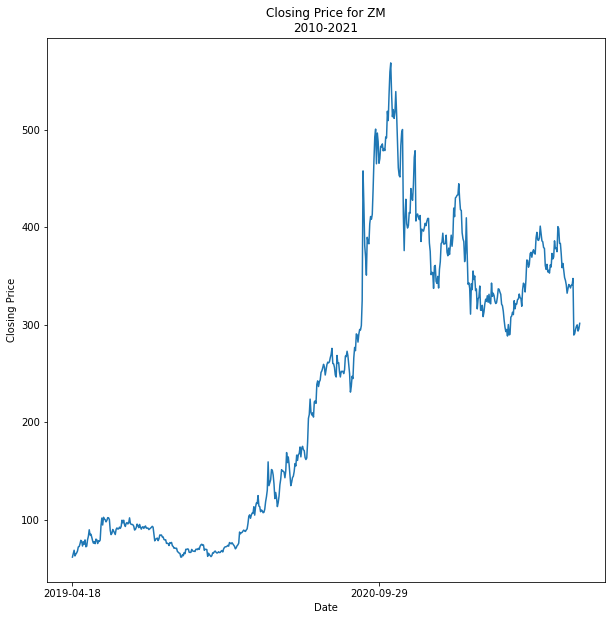

In [11]:
for name in df['Name'].unique():
    closing_price(name)

One common trend observed here is that after march 2020, we have a large drop in the stock prices. This might be because traders were affected by the pandemic caused by COVID-19

## Trend for all companies

In [10]:
def plotting(dct,strg):
    lst = dct.items()
    lst = sorted(lst)
    x,y = zip(*lst)
    fig, ax = plt.subplots(figsize = (10,10))
    ax.plot(x,y)
    ax.set(xlabel = "Date",ylabel = "Adjusted Closing Price",title = "Adjusted Closing Price for {}\n2010-2021".format(strg)) 
    Axis.set_major_locator(ax.xaxis,mdates.YearLocator())
    ax.format_xdata = mdates.DateFormatter('%Y')
    plt.show()

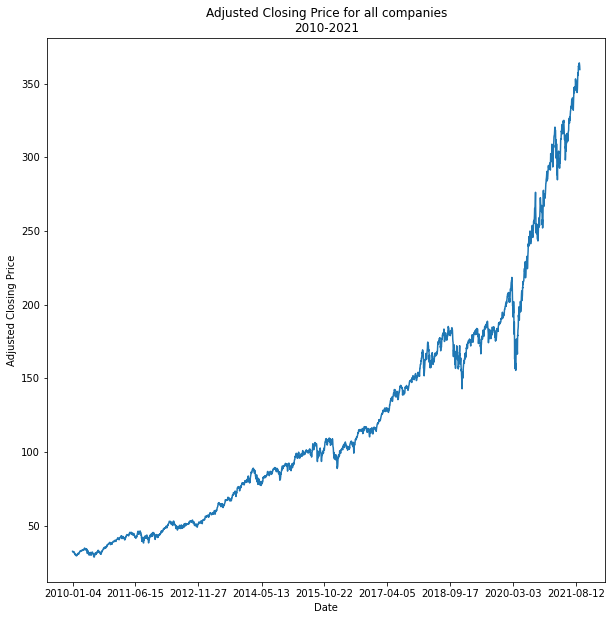

In [11]:
size = len(df['Name'].unique())
df_data = {date:0.0 for date in df['Date'].unique()}
for date in df_data:
    df_data[date] = df.loc[(df['Date'] == date)]['Adj Close'].mean()
plotting(df_data,'all companies')

The sectors involved are: Technology, Consumer services, Consumer goods, Health Care, Industrials, Telecommunications, Utilities, Basic Materials. From these we can calculate the evolution of each industry.

Here we start off with equal weights in the sectors and see the performance of each sector(weights are kept equal since NDX weights constantly changes)

In [14]:
df['Name'].unique()

array(['AAPL', 'ADBE', 'ADI', 'ADP', 'ADSK', 'AEP', 'ALGN', 'AMAT', 'AMD',
       'AMGN', 'AMZN', 'ANSS', 'ASML', 'ATVI', 'AVGO', 'BIDU', 'BIIB',
       'BKNG', 'CDNS', 'CDW', 'CERN', 'CHKP', 'CHTR', 'CMCSA', 'COST',
       'CPRT', 'CRWD', 'CSCO', 'CSX', 'CTAS', 'CTSH', 'DLTR', 'DOCU',
       'DXCM', 'EA', 'EBAY', 'EXC', 'FAST', 'FB', 'FISV', 'FOX', 'FOXA',
       'GILD', 'GOOG', 'GOOGL', 'HON', 'IDXX', 'ILMN', 'INCY', 'INTC',
       'INTU', 'ISRG', 'JD', 'KDP', 'KHC', 'KLAC', 'LRCX', 'LULU', 'MAR',
       'MCHP', 'MDLZ', 'MELI', 'MNST', 'MRNA', 'MRVL', 'MSFT', 'MTCH',
       'MU', 'NFLX', 'NTES', 'NVDA', 'NXPI', 'OKTA', 'ORLY', 'PAYX',
       'PCAR', 'PDD', 'PEP', 'PTON', 'PYPL', 'QCOM', 'REGN', 'ROST',
       'SBUX', 'SGEN', 'SIRI', 'SNPS', 'SPLK', 'SWKS', 'TCOM', 'TEAM',
       'TMUS', 'TSLA', 'TXN', 'VRSK', 'VRSN', 'VRTX', 'WBA', 'WDAY',
       'XEL', 'XLNX', 'ZM'], dtype=object)

In [15]:
commercial_services = ['CPRT']
communications = ['TMUS']
consumer_durables = ['TSLA','ATVI','EA','TTWO']
consumer_non_durables = ['PEP','MDLZ','MNST','KHC']
consumer_services = ['NFLX','CSMCSA','CHTR','SBUX','BKNG','EBAY','CTAS','MAR','SIRI','TCOM','FOXA','EXPE','LBTYA',
                     'LBTYK']
distribution_services = ['FAST']
electronic_tech = ['AAPL','NVDA','INTC','AVGO','QCOM','TXN','AMD','MU','LRCX','ADI','NXPI','KLAC','XLNX','MCHP',
                   'SWKS','MXIM','WDC']
finance = ['VRSK']
health_technology = ['AMGN','ISRG','GILD','REGN','VRTX','ILMN','BIIB','DXCM','ALGN','IDXX','SGEN','MRNA','ALXN',
                     'INCY']
producer_manufacturing = ['ASML','AMAT','PCAR']
retail_trade = ['AMZN','COST','JD','PDD','LULU','ORLY','ROST','WBA','DLTR','ULTA']
technology_services = ['MSFT','GOOG','GOOGL','FB','PYPL','ADBE','CSCO','ZM','INTU','FISV','MELI','ADP','NTES',
                       'ADSK','WDAY','DOCU','CTSH','BIDU','SPLK','SNPS','CDNS','PAYX','VRSN','CERN','CDW','CHKP',
                       'CTXS']
transportation = ['CSX']
utilities = ['EXC','XEL']

If we take equal weights for all companies, it just means that we are taking the average of the stock price.

## Sector Analysis

In [17]:
import pandas as pd
import numpy as np
def sector_analysis(lst):
    size = len(lst)
    df_data = {date:0.0 for date in df['Date'].unique()}
    for date in df_data:
        srs = pd.Series(dtype = 'float64')
        for name in lst:
            srs = srs.append(df.loc[(df['Date'] == date) & (df['Name'] == name)]['Adj Close'])
        df_data[date] = srs.mean()
    return df_data

In [18]:
dictionary = [commercial_services,communications,consumer_durables,consumer_non_durables,consumer_services,
      distribution_services,electronic_tech,finance,health_technology,producer_manufacturing,retail_trade,
      technology_services,transportation,utilities]

In [12]:
sec = ['commercial_services','communications','consumer_durables','consumer_non_durables','consumer_services',
      'distribution_services','electronic_tech','finance','health_technology','producer_manufacturing','retail_trade',
      'technology_services','transportation','utilities']

In [13]:
import json

f = open('sector_data.json',)

dct = json.load(f)
f.close

<function TextIOWrapper.close()>

In [41]:
## DO NOT execute this cell
commercial_services_dct = sector_analysis(commercial_services)

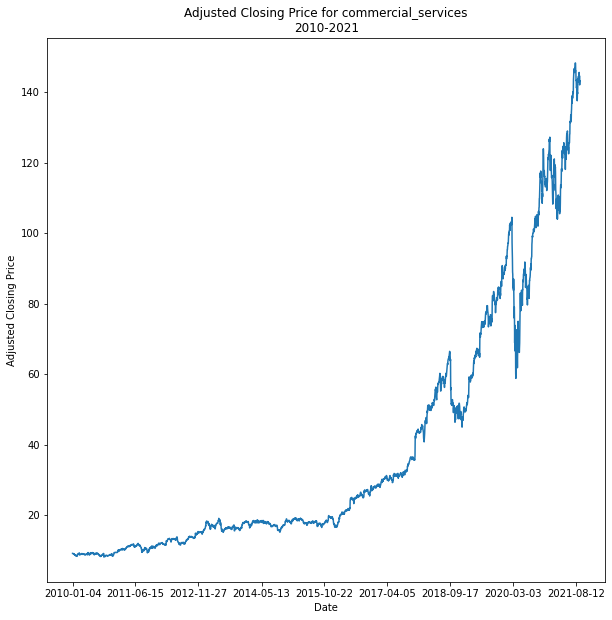

In [27]:
plotting(dct['commercial_services'],sec[0])

In [44]:
## DO NOT execute this cell
communications_dct = sector_analysis(communications)

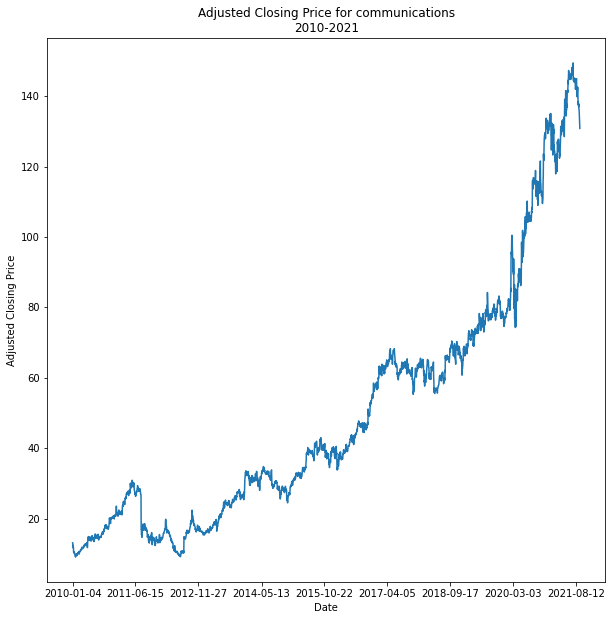

In [28]:
plotting(dct['communications'],sec[1])

In [46]:
## DO NOT execute this cell
consumer_durables_dct= sector_analysis(consumer_durables)

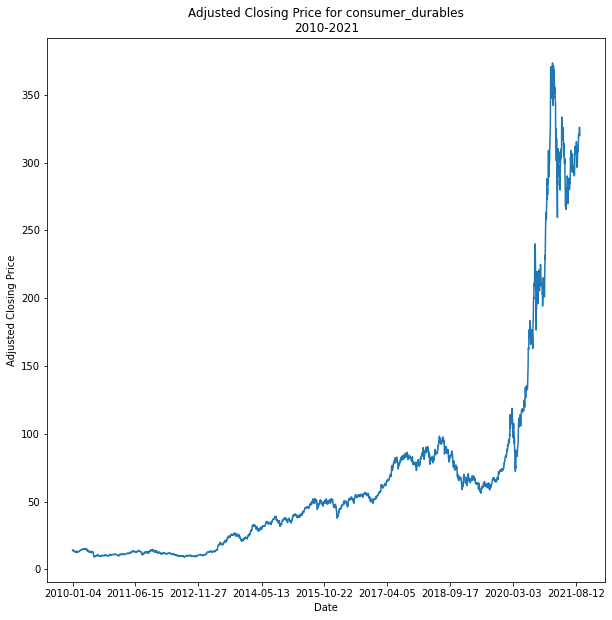

In [40]:
plotting(dct['consumer_durables'],sec[2])

In [48]:
## DO NOT run this cell
consumer_non_durables_dct = sector_analysis(consumer_non_durables)

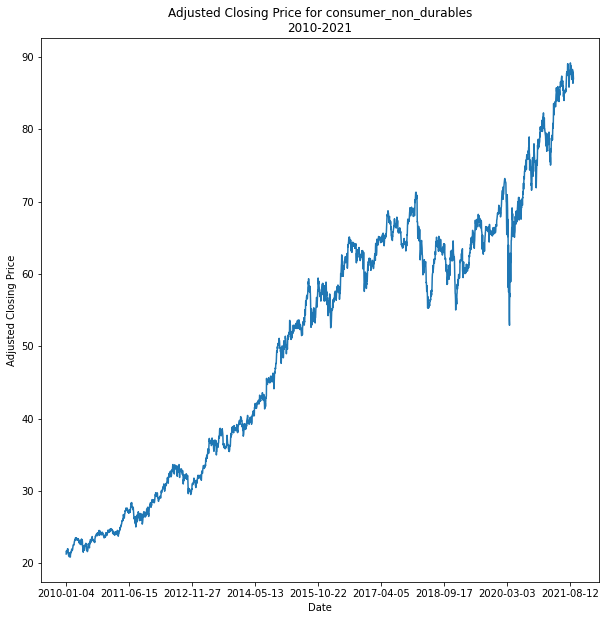

In [29]:
plotting(dct['consumer_non_durables'],sec[3])

In [50]:
## DO NOT run this cell
consumer_services_dct = sector_analysis(consumer_services)

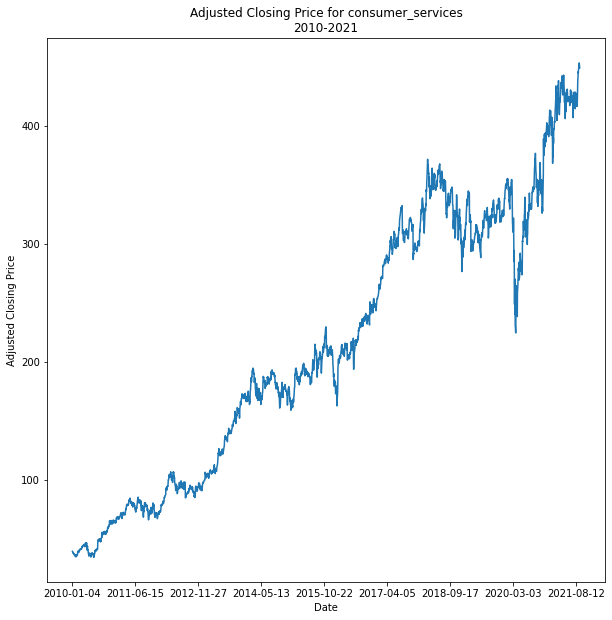

In [30]:
plotting(dct['consumer_services'],sec[4])

In [53]:
## DO NOT run this cell
distribution_services_dct = sector_analysis(distribution_services)

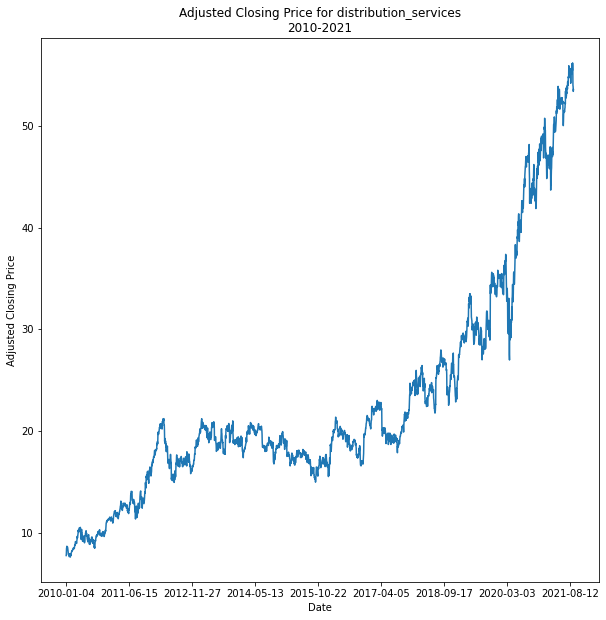

In [31]:
plotting(dct['distribution_services'],sec[5])

In [56]:
## DO NOT run this cell
electronic_tech_dct = sector_analysis(electronic_tech)

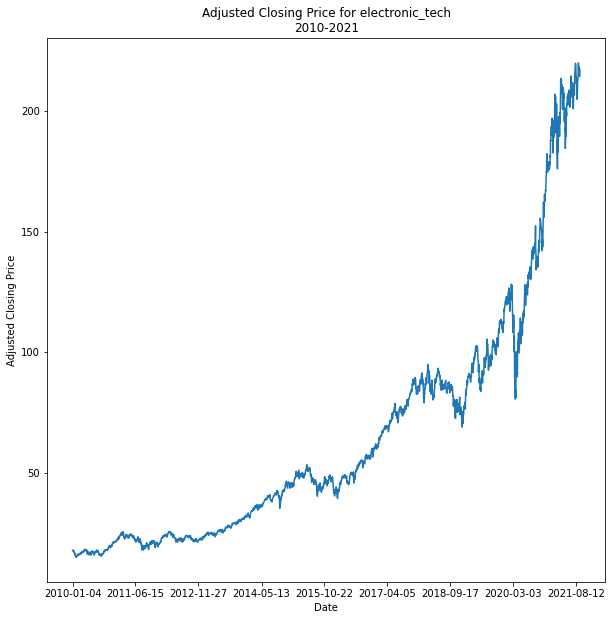

In [32]:
plotting(dct['electronic_tech'],sec[6])

In [59]:
## DO NOT run this cell
finance_dct = sector_analysis(finance)

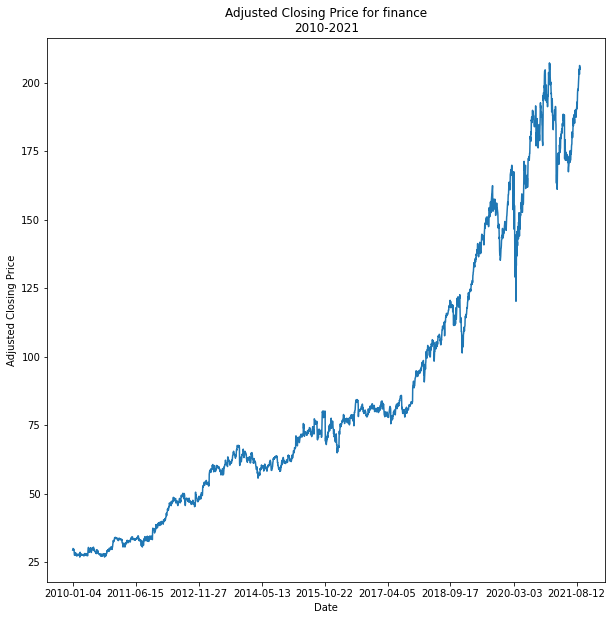

In [33]:
plotting(dct['finance'],sec[7])

In [61]:
## DO NOT run this cell
health_technology_dct = sector_analysis(health_technology)

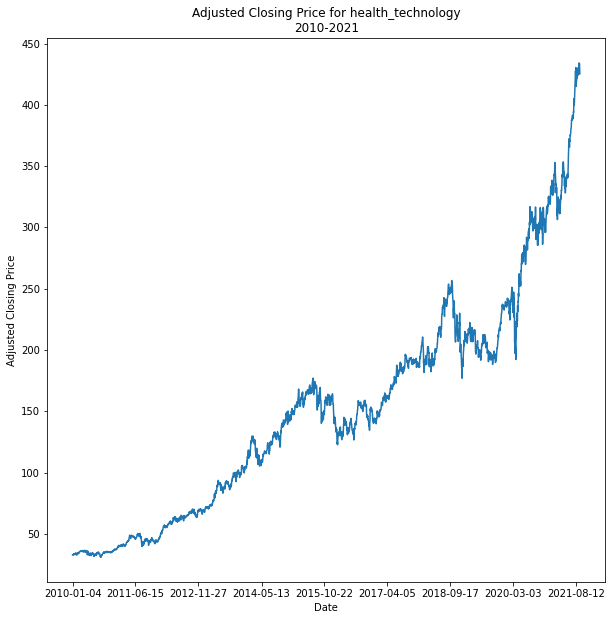

In [34]:
plotting(dct['health_technology'],sec[8])

In [63]:
## DO NOT run this cell
producer_manufacturing_dct = sector_analysis(producer_manufacturing)

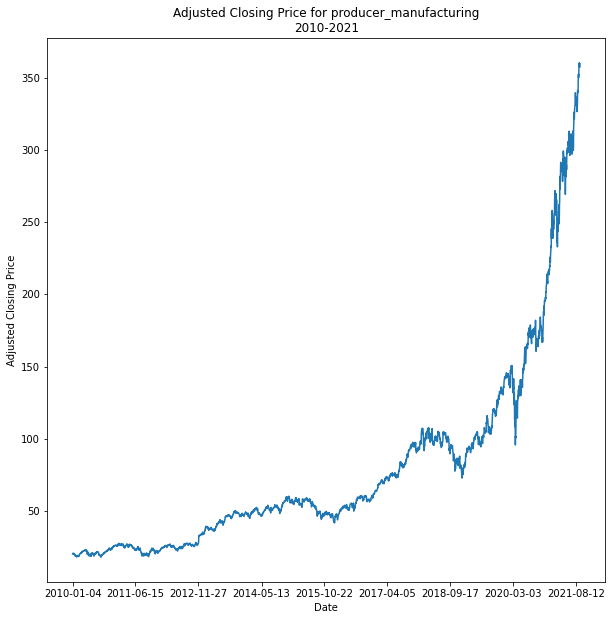

In [35]:
plotting(dct['producer_manufacturing'],sec[9])

In [65]:
## DO NOT run this cell
retail_trade_dct = sector_analysis(retail_trade)

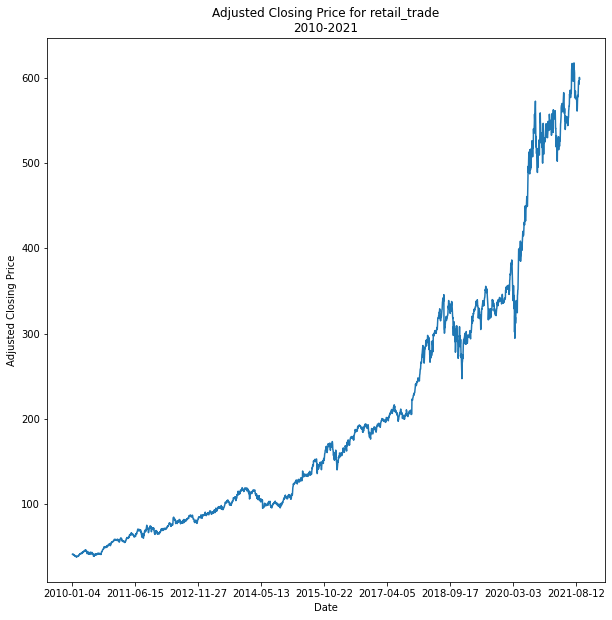

In [36]:
plotting(dct['retail_trade'],sec[10])

In [67]:
## DO NOT run this cell
technology_services_dct = sector_analysis(technology_services)

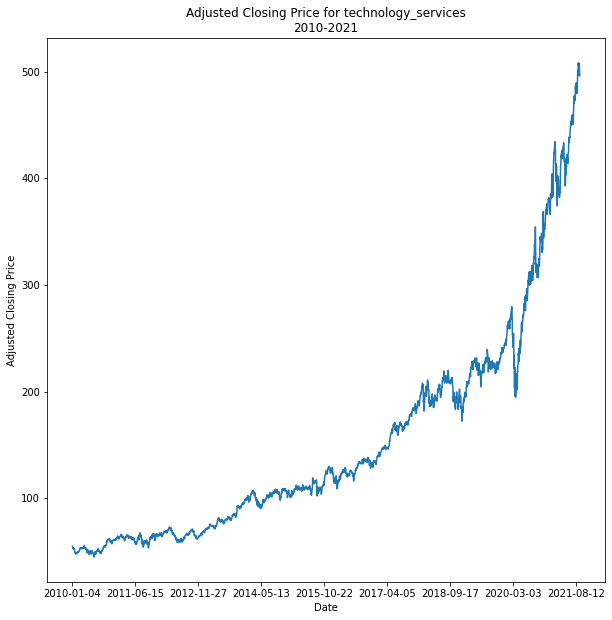

In [37]:
plotting(dct['technology_services'],sec[11])

In [69]:
## DO NOT run this cell
transportation_dct = sector_analysis(transportation)

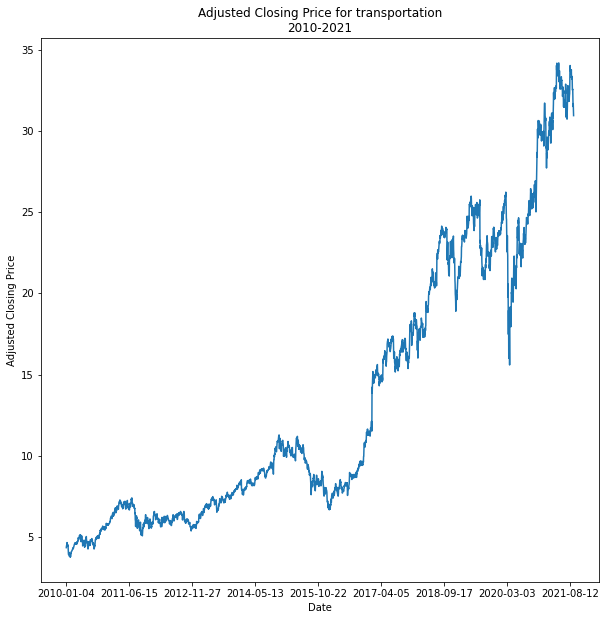

In [38]:
plotting(dct['transportation'],sec[12])

In [71]:
## DO NOT run this cell
utilities_dct = sector_analysis(utilities)

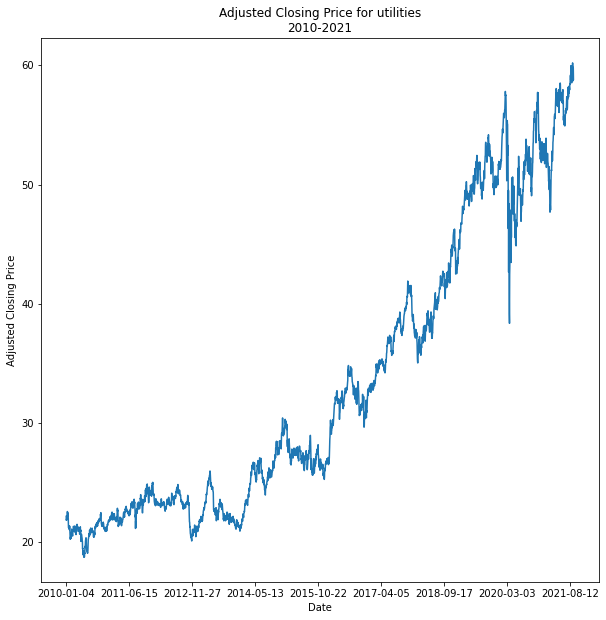

In [39]:
plotting(dct['utilities'],sec[13])

Storing the sector data in a json since calculating the data is computationally expensive

In [79]:
## DO NOT execute this cell
import json

dct = {sec[0]:commercial_services_dct,
      sec[1]:communications_dct,
      sec[2]:consumer_durables_dct,
      sec[3]:consumer_non_durables_dct,
      sec[4]:consumer_services_dct,
      sec[5]:distribution_services_dct,
      sec[6]:electronic_tech_dct,
      sec[7]:finance_dct,
      sec[8]:health_technology_dct,
      sec[9]:producer_manufacturing_dct,
      sec[10]:retail_trade_dct,
      sec[11]:technology_services_dct,
      sec[12]:transportation_dct,
      sec[13]:utilities_dct}
with open('sector_data.json','w') as fp:
    json.dump(dct,fp,indent = 4)

## Sector-wise analysis

Commercial services

In [22]:
print("Commercial Sector has gained: {}".format(dct[sec[0]]['2021-09-10'] - dct[sec[0]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[0]]['2021-09-10'] - dct[sec[0]]['2010-01-04'])/dct[sec[0]]['2010-01-04']))

Commercial Sector has gained: 134.12749576568598
Percentage gain: 14.73523716866692


Communications

In [23]:
print("Commercial Sector has gained: {}".format(dct[sec[1]]['2021-09-10'] - dct[sec[1]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[1]]['2021-09-10'] - dct[sec[1]]['2010-01-04'])/dct[sec[1]]['2010-01-04']))

Commercial Sector has gained: 117.6029539108279
Percentage gain: 8.904563129139033


Consumer Durables

In [24]:
print("Commercial Sector has gained: {}".format(dct[sec[2]]['2021-09-10'] - dct[sec[2]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[2]]['2021-09-10'] - dct[sec[2]]['2010-01-04'])/dct[sec[2]]['2010-01-04']))

Commercial Sector has gained: 306.27755276362086
Percentage gain: 21.769486134148117


Consumer non durables

In [25]:
print("Commercial Sector has gained: {}".format(dct[sec[3]]['2021-09-10'] - dct[sec[3]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[3]]['2021-09-10'] - dct[sec[3]]['2010-01-04'])/dct[sec[3]]['2010-01-04']))

Commercial Sector has gained: 65.68635145823154
Percentage gain: 3.084061719027049


Consumer Services

In [26]:
print("Commercial Sector has gained: {}".format(dct[sec[4]]['2021-09-10'] - dct[sec[4]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[4]]['2021-09-10'] - dct[sec[4]]['2010-01-04'])/dct[sec[4]]['2010-01-04']))

Commercial Sector has gained: 410.17659340351776
Percentage gain: 10.437752288467413


Distribution services

In [27]:
print("Commercial Sector has gained: {}".format(dct[sec[5]]['2021-09-10'] - dct[sec[5]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[5]]['2021-09-10'] - dct[sec[5]]['2010-01-04'])/dct[sec[5]]['2010-01-04']))

Commercial Sector has gained: 45.806165695190444
Percentage gain: 5.892350301013635


Electronic Tech

In [28]:
print("Commercial Sector has gained: {}".format(dct[sec[6]]['2021-09-10'] - dct[sec[6]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[6]]['2021-09-10'] - dct[sec[6]]['2010-01-04'])/dct[sec[6]]['2010-01-04']))

Commercial Sector has gained: 199.38831802549817
Percentage gain: 11.178346949667981


Finance

In [29]:
print("Commercial Sector has gained: {}".format(dct[sec[7]]['2021-09-10'] - dct[sec[7]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[7]]['2021-09-10'] - dct[sec[7]]['2010-01-04'])/dct[sec[7]]['2010-01-04']))

Commercial Sector has gained: 176.19316101074241
Percentage gain: 6.001775012604422


Health Technology

In [30]:
print("Commercial Sector has gained: {}".format(dct[sec[8]]['2021-09-10'] - dct[sec[8]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[8]]['2021-09-10'] - dct[sec[8]]['2010-01-04'])/dct[sec[8]]['2010-01-04']))

Commercial Sector has gained: 392.5574875856062
Percentage gain: 11.987541446568052


Producer Manufacturing

In [31]:
print("Commercial Sector has gained: {}".format(dct[sec[9]]['2021-09-10'] - dct[sec[9]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[9]]['2021-09-10'] - dct[sec[9]]['2010-01-04'])/dct[sec[9]]['2010-01-04']))

Commercial Sector has gained: 339.4000250498457
Percentage gain: 16.659055288813168


Retail Trade

In [32]:
print("Commercial Sector has gained: {}".format(dct[sec[10]]['2021-09-10'] - dct[sec[10]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[10]]['2021-09-10'] - dct[sec[10]]['2010-01-04'])/dct[sec[10]]['2010-01-04']))

Commercial Sector has gained: 557.9968443068248
Percentage gain: 13.678692545952254


technology services

In [33]:
print("Commercial Sector has gained: {}".format(dct[sec[11]]['2021-09-10'] - dct[sec[11]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[11]]['2021-09-10'] - dct[sec[11]]['2010-01-04'])/dct[sec[11]]['2010-01-04']))

Commercial Sector has gained: 441.06555734086146
Percentage gain: 8.032036960242127


Transportation

In [34]:
print("Commercial Sector has gained: {}".format(dct[sec[12]]['2021-09-10'] - dct[sec[12]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[12]]['2021-09-10'] - dct[sec[12]]['2010-01-04'])/dct[sec[12]]['2010-01-04']))

Commercial Sector has gained: 26.59944248199468
Percentage gain: 6.114029686373497


Utilities

In [35]:
print("Commercial Sector has gained: {}".format(dct[sec[13]]['2021-09-10'] - dct[sec[13]]['2010-01-04']))
print("Percentage gain: {}".format((dct[sec[13]]['2021-09-10'] - dct[sec[13]]['2010-01-04'])/dct[sec[13]]['2010-01-04']))

Commercial Sector has gained: 36.69527435302736
Percentage gain: 1.657440263455137


As we can see from the above, the biggest winner is someone who had invested in retail trade sector in 2010. Technology services will always be in the top 3 as there are major companies such as Microsoft, Adobe, Paypal, Facebook, Google. Retail trade takes the cake since it has the biggest retailer namely Amazon.

One thing to note from the above is that consumer durables sector has the greatest percentage change at 21%. This could be attributed to Tesla, Inc. Elon Musk took office in 2008 which might the reason for this